### 안전모(hard hat) 탐지 모델

In [1]:
!git clone https://github.com/ultralytics/yolov5
%cd /content/yolov5/
!pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 13286, done.
remote: Total 13286 (delta 0), reused 0 (delta 0), pack-reused 13286
Receiving objects: 100% (13286/13286), 12.02 MiB | 24.87 MiB/s, done.
Resolving deltas: 100% (9250/9250), done.
/content/yolov5
     |████████████████████████████████| 596 kB 8.7 MB/s 


#### 데이터셋 다운로드
- 안전모 데이터셋: https://public.roboflow.com/object-detection/hard-hat-workers/

In [ ]:
%mkdir hardhat
%cd hardhat
!curl -L "https://public.roboflow.com/ds/BJRRyYVjUg?key=W9Z9bx4j2u" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
%cd ../..

In [12]:
from glob import glob

train_image_list = glob("yolov5/hardhat/train/images/*.jpg")
test_image_list = glob("yolov5/hardhat/test/images/*.jpg")

print(len(train_image_list), len(test_image_list))

5269 1766


In [13]:
from sklearn.model_selection import train_test_split


test_image_list, valid_image_list = train_test_split(test_image_list, test_size=0.5, random_state=777)
print(len(test_image_list), len(valid_image_list))

883 883


In [14]:
import yaml

with open("yolov5/hardhat/train.txt", "w") as f:
    f.write("\n".join(train_image_list) + "\n")

with open("yolov5/hardhat/test.txt", "w") as f:
    f.write("\n".join(test_image_list) + "\n")

with open("yolov5/hardhat/valid.txt", "w") as f:
    f.write("\n".join(valid_image_list) + "\n")

In [15]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def write_template(line, cell):
    with open(line, "w") as f:
        f.write(cell.format(**globals()))

In [16]:
%cat yolov5/hardhat/data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['head', 'helmet', 'person']

In [17]:
%%write_template yolov5/hardhat/data.yaml

train: ./hardhat/train/images
test: ./hardhat/test/images
val: ./hardhat/test/images

nc: 3
names: ['head', 'helmet', 'person']

In [18]:
%cat yolov5/hardhat/data.yaml


train: ./hardhat/train/images
test: ./hardhat/test/images
val: ./hardhat/test/images

nc: 3
names: ['head', 'helmet', 'person']

#### 모델 구성

In [19]:
import yaml

with open("yolov5/hardhat/data.yaml", "r") as stream:
    num_classes = str(yaml.safe_load(stream)["nc"])

%cat yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [20]:
%%write_template yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [21]:
%cat yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

#### 학습(Training)
- img: 입력 이미지 크기 정의
- batch: 배치 크기 정의
- epochs: 학습 횟수 정의
- data: yaml 파일 경로
- cfg: 모델 구성 지정
- weights: 가중치에 대한 경로 지정
- name: 결과 이름
- nosave: 최종 체크포인트만 저장
- cache: 빠른 학습을 위한 이미지 캐시

In [23]:
%time
%cd yolov5


!python train.py --img 416 --batch 128 --epochs 100 --data hardhat/data.yaml --cfg models/custom_yolov5s.yaml --weights "" --name hardhat_results --cache

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 8.11 µs
[Errno 2] No such file or directory: 'yolov5'
/content/yolov5
train: weights=, cfg=models/custom_yolov5s.yaml, data=hardhat/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=128, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=hardhat_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_

In [24]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [25]:
!ls /content/yolov5/runs/train/hardhat_results

confusion_matrix.png				   results.png
events.out.tfevents.1652147814.4c47b85a8ce2.296.0  train_batch0.jpg
F1_curve.png					   train_batch1.jpg
hyp.yaml					   train_batch2.jpg
labels_correlogram.jpg				   val_batch0_labels.jpg
labels.jpg					   val_batch0_pred.jpg
opt.yaml					   val_batch1_labels.jpg
P_curve.png					   val_batch1_pred.jpg
PR_curve.png					   val_batch2_labels.jpg
R_curve.png					   val_batch2_pred.jpg
results.csv					   weights


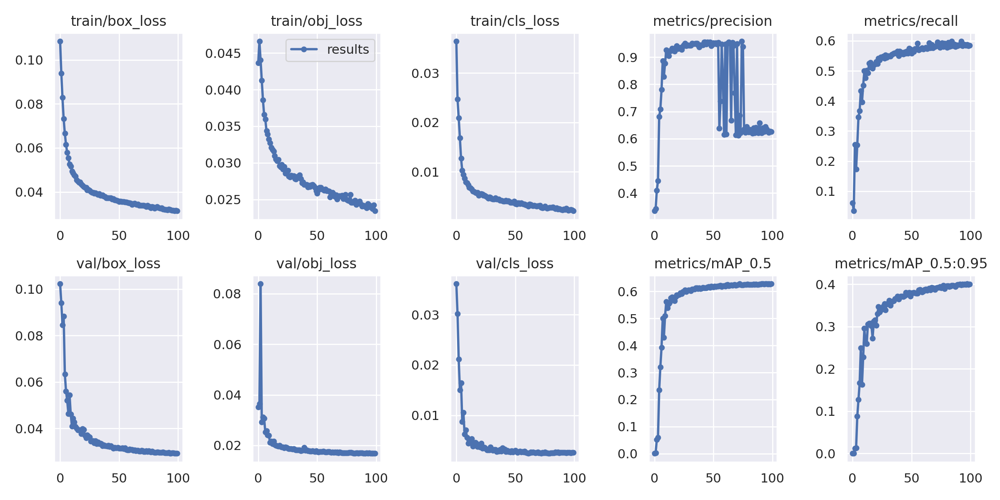

In [27]:
from IPython.display import Image

Image(filename="runs/train/hardhat_results/results.png", width=800)

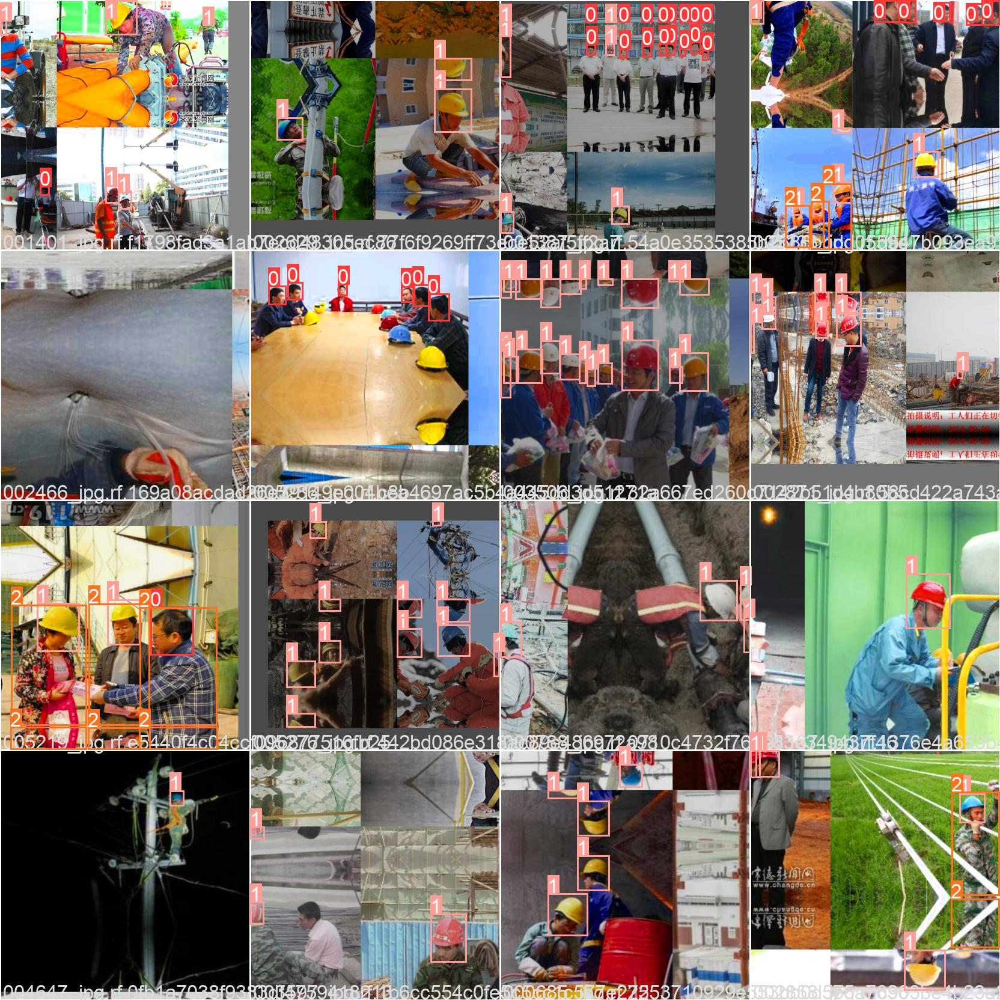

In [28]:
Image(filename="runs/train/hardhat_results/train_batch0.jpg", width=800)

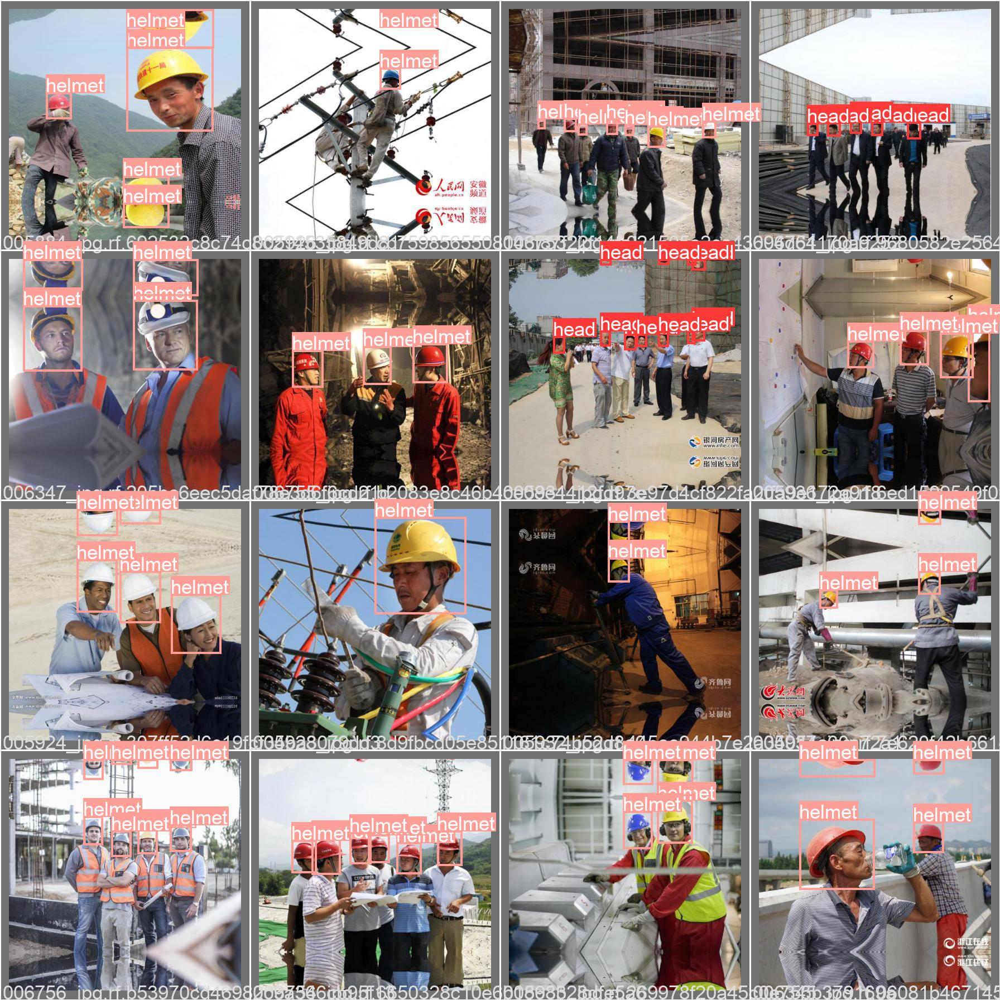

In [29]:
Image(filename="runs/train/hardhat_results/val_batch0_labels.jpg", width=800)

#### 검증(Validation)

In [30]:
!python val.py --weights runs/train/hardhat_results/weights/best.pt --data hardhat/data.yaml --img 416 --iou 0.65 --half

val: data=hardhat/data.yaml, weights=['runs/train/hardhat_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/content/yolov5/hardhat/test/labels.cache' images and labels... 1766 found, 0 missing, 0 empty, 0 corrupt: 100% 1766/1766 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 56/56 [00:15<00:00,  3.66it/s]
                 all       1766       8915      0.625      0.585      0.627        0.4
                head       1766       2208      0.926      0.874      0.924      0.585
              hel

In [31]:
!python val.py --weights runs/train/hardhat_results/weights/best.pt --data hardhat/data.yaml --img 416 --iou 0.65 --task test

val: data=hardhat/data.yaml, weights=['runs/train/hardhat_results/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-177-gd059d1d torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning '/content/yolov5/hardhat/test/labels.cache' images and labels... 1766 found, 0 missing, 0 empty, 0 corrupt: 100% 1766/1766 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 56/56 [00:16<00:00,  3.44it/s]
                 all       1766       8915      0.625      0.585      0.627        0.4
                head       1766       2208      0.926      0.874      0.924      0.585
              

#### 추론(Inference)

In [32]:
!ls runs/train/hardhat_results/weights

best.pt  last.pt


In [ ]:
!python detect.py --weights runs/train/hardhat_results/weights/best.pt --img 416 --conf 0.4 --source hardhat/test/images

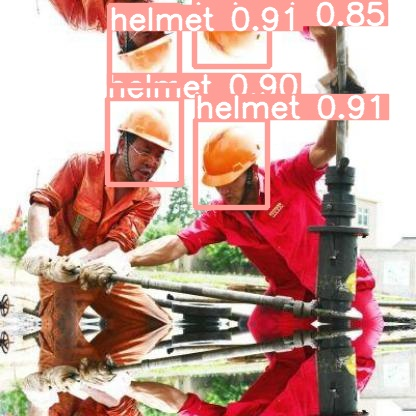

In [36]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob("runs/detect/exp/*.jpg"))
display(Image(filename=image_name))

In [37]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
